In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import sys
import zipfile
from PIL import Image
from io import BytesIO
import shutil
import shutil
from tqdm import tqdm
import torch
from torchvision import models
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tqdm.notebook import tqdm
import random
from sklearn.metrics import accuracy_score
from tqdm.notebook import tqdm  # Barra di avanzamento
import shutil

# Carichiamo i dati

In [ ]:
csv_file = '/kaggle/input/train-small/train_small.csv'  # Percorso del file CSV
images_dir = '/kaggle/input/train-solo/train_final'  # Percorso della cartella immagini

df_labels = pd.read_csv(csv_file, header=None, names=['filename', 'label'])

labeled_dataset = []

for _, row in tqdm(df_labels.iterrows(), total=len(df_labels), desc="Matching images"):
    image_file = row['filename']
    label = row['label']
    image_path = os.path.join(images_dir, image_file)

    if os.path.exists(image_path):
        labeled_dataset.append((image_path, label))

print(f"Numero di immagini matchate: {len(labeled_dataset)}")

for i in range(5):
    print(labeled_dataset[i])


Matching images:   0%|          | 0/5020 [00:00<?, ?it/s]

Numero di immagini matchate: 5020
('/kaggle/input/train-solo/train_final/train_059371.jpg', 0)
('/kaggle/input/train-solo/train_final/train_059389.jpg', 0)
('/kaggle/input/train-solo/train_final/train_059425.jpg', 0)
('/kaggle/input/train-solo/train_final/train_059445.jpg', 0)
('/kaggle/input/train-solo/train_final/train_059516.jpg', 0)


# Processiamo le immagini

In [ ]:
import numpy as np
from PIL import Image

# Funzione per preprocessare un'immagine
def preprocess_image(img_path, target_size=(224, 224)):
    img = Image.open(img_path).convert("RGB")  # Converte in RGB
    img = img.resize(target_size)  # Ridimensiona l'immagine
    img_array = np.array(img) / 255.0  # Normalizza i pixel tra [0, 1]
    img_array = np.expand_dims(img_array, axis=0)  # Aggiungi la dimensione batch
    return img_array

# labeled_dataset contiene (image_path, label)
images_to_train = [img[0] for img in labeled_dataset]  # Estrae i percorsi delle immagini
true_labels = [label for _, label in labeled_dataset]  # Estrae le label corrispondenti

processed_images = np.vstack([preprocess_image(img) for img in images_to_train])

true_labels = np.array(true_labels)

print(f"Numero di immagini preprocessate: {processed_images.shape[0]}")
print(f"Shape di ogni immagine: {processed_images.shape[1:]}")  # (224, 224, 3)
print(f"Numero di label: {true_labels.shape[0]}")

Numero di immagini preprocessate: 5020
Shape di ogni immagine: (224, 224, 3)
Numero di label: 5020


## SIFT

SIFT (Scale-Invariant Feature Transform) è un algoritmo utilizzato in computer vision per rilevare e descrivere caratteristiche locali (feature) nelle immagini.

In [ ]:
import os
import cv2
import numpy as np
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# ---------------------------
# 1. Estrazione delle feature SIFT
# ---------------------------
def extract_sift_descriptors(image_path, sift):
    """
    Carica un'immagine, la converte in scala di grigi ed estrae i descrittori SIFT.
    Restituisce un array di descrittori (di dimensione 128) oppure None se l'immagine non è valida.
    """
    image = cv2.imread(image_path)
    if image is None:
        return None
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    return descriptors

image_dir = "/kaggle/input/train-solo/train_final"  
image_files = [os.path.join(image_dir, f) for f in os.listdir(image_dir)
               if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

In [ ]:
sift = cv2.SIFT_create()

# Liste per memorizzare i descrittori e per tenere traccia delle immagini con descrittori validi
all_descriptors = []      # Per il vocabolario visivo (aggregato)
image_descriptor_list = []  # Per ogni immagine
valid_image_files = []      # File per cui sono stati estratti descrittori

print("Estrazione dei descrittori SIFT da ogni immagine...")
for image_path in image_files:
    descriptors = extract_sift_descriptors(image_path, sift)
    if descriptors is not None:
        image_descriptor_list.append(descriptors)
        valid_image_files.append(image_path)
        all_descriptors.append(descriptors)
        
if len(all_descriptors) == 0:
    print("Nessun descrittore estratto. Controlla i file o il formato delle immagini.")
    exit()

all_descriptors = np.vstack(all_descriptors)
print(f"Totale descrittori estratti: {all_descriptors.shape}")

Estrazione dei descrittori SIFT da ogni immagine...
Totale descrittori estratti: (3639349, 128)


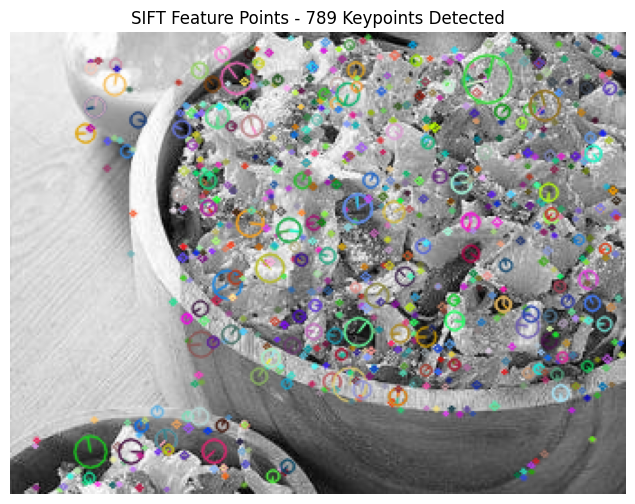

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Funzione per estrarre e disegnare i punti chiave SIFT
def show_sift_keypoints(image_path):
    # Carica l'immagine in scala di grigi
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    
    # Inizializza il detector SIFT
    sift = cv2.SIFT_create()
    
    # Trova i keypoints e i descrittori SIFT
    keypoints, descriptors = sift.detectAndCompute(image, None)
    
    # Disegna i keypoints sull'immagine
    sift_image = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    # Mostra l'immagine con i keypoints
    plt.figure(figsize=(8, 6))
    plt.imshow(sift_image, cmap='gray')
    plt.title(f"SIFT Feature Points - {len(keypoints)} Keypoints Detected")
    plt.axis("off")
    plt.show()

# Test con un'immagine di esempio
image_path = "/kaggle/input/train-solo/train_final/train_000027.jpg"  
show_sift_keypoints(image_path)

## K-Means

KMeans è usato per creare una rappresentazione compatta delle immagini, mentre DBSCAN è usato per rilevare gli outlier in quella rappresentazione.

Perché KMeans è necessario prima:
- I descrittori SIFT generano un’enorme quantità di dati: ogni immagine può produrre centinaia o migliaia di descrittori locali.
- Non possiamo applicare direttamente DBSCAN a tutti i descrittori locali, perché sarebbe computazionalmente costoso e disorganizzato.
- Quindi, utilizziamo KMeans per ridurre i descrittori SIFT in un set di "parole visive" (cluster). Ogni cluster rappresenta una "parola" e ogni immagine è rappresentata da un istogramma che conta quante volte le parole visive appaiono.

In [ ]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Lista specifica di valori di K
K_values = [2, 10, 50, 100]

inertia_values = []

# Calcolo dell'inerzia per ciascun K
for K in K_values:
    kmeans = KMeans(n_clusters=K, random_state=42)
    kmeans.fit(all_descriptors)  # Usa tutti i descrittori
    inertia_values.append(kmeans.inertia_)

# Grafico dell'Elbow
plt.figure(figsize=(8, 5))
plt.plot(K_values, inertia_values, marker='o')
plt.xlabel('Numero di cluster (K)')
plt.ylabel('Inertia')
plt.title('Metodo del gomito (Elbow Method)')
plt.xticks(K_values)  # Mostra solo i valori specifici di K sull'asse x
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Scelta del miglior k:
Il punto del "gomito" si trova intorno a K=50, perché qui la curva cambia pendenza in modo significativo.
Aumentare ulteriormente K non porta a grandi riduzioni dell'inerzia.
K=50 bilancia bene il compromesso tra il numero di cluster e la qualità della rappresentazione. 


In [ ]:
# ---------------------------
#  Costruzione del vocabolario visivo con K-Means
# ---------------------------
K = 50  # Numero di cluster (parole visive); questo parametro può essere ottimizzato
print(f"Costruzione del vocabolario visivo con {K} cluster...")
kmeans = KMeans(n_clusters=K, random_state=42)
kmeans.fit(all_descriptors)
# Il centroide di ogni cluster rappresenta una parola visiva
vocab = kmeans.cluster_centers_

Costruzione del vocabolario visivo con 50 cluster...


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
import numpy as np
from scipy.cluster.vq import vq

# ---------------------------
#  Quantizzazione: Creazione del BoVW per ogni immagine
# ---------------------------

# Numero di cluster (parole visive) = K (già definito)
num_images = len(image_descriptor_list)
bovw_features = np.zeros((num_images, K))  # Matrice BoVW per tutte le immagini

print("Creazione delle feature BoVW per ogni immagine...")

for i, descriptors in enumerate(image_descriptor_list):
    if descriptors is not None:
        # Assegna ogni descrittore al cluster più vicino (parola visiva)
        words, _ = vq(descriptors, vocab)
        
        # Costruisce l'istogramma delle parole visive
        for w in words:
            bovw_features[i, w] += 1

# Normalizza gli istogrammi per ridurre l'impatto della quantità di feature
bovw_features = bovw_features / np.linalg.norm(bovw_features, axis=1, keepdims=True)

print("Bag-of-Visual-Words (BoVW) completato! Shape finale:", bovw_features.shape)


In [ ]:
# ---------------------------
# Costruzione degli istogrammi per ogni immagine
# ---------------------------
def compute_histogram(descriptors, kmeans, K):
    """
    Per un set di descrittori, predice gli indici dei cluster e costruisce l'istogramma delle parole visive.
    Restituisce un vettore di dimensione K.
    """
    if descriptors is None or len(descriptors) == 0:
        return np.zeros(K)
    cluster_indices = kmeans.predict(descriptors)
    hist, _ = np.histogram(cluster_indices, bins=np.arange(K+1))
    # Normalizza l'istogramma
    hist = hist.astype(float) / (np.sum(hist) + 1e-7)
    return hist

# Calcola l'istogramma per ogni immagine
image_histograms = []
for descriptors in image_descriptor_list:
    hist = compute_histogram(descriptors, kmeans, K)
    image_histograms.append(hist)

image_histograms = np.array(image_histograms)
print(f"Forma degli istogrammi delle immagini: {image_histograms.shape}")

Forma degli istogrammi delle immagini: (5020, 50)


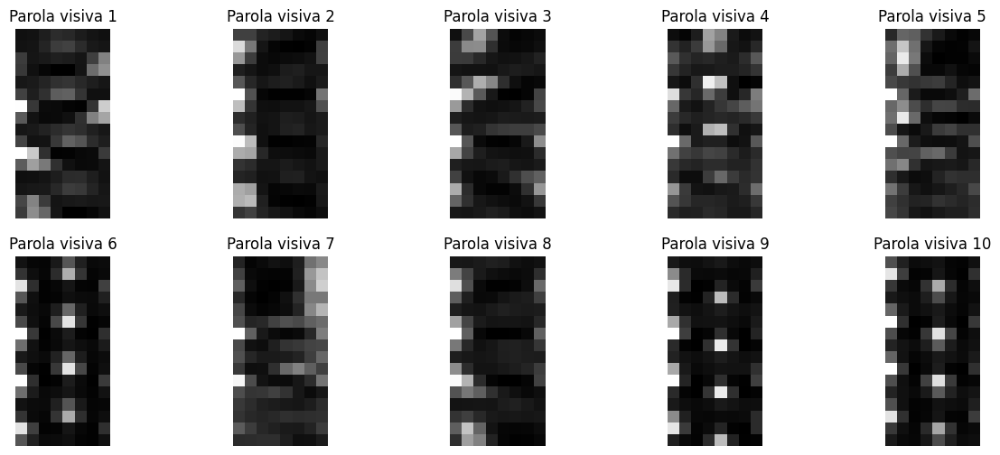

In [8]:
import matplotlib.pyplot as plt

# Visualizza le prime 10 parole visive
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.flatten()

for i in range(10):
    # Ottieni la parola visiva dal centroide
    visual_word = vocab[i].reshape(16, 8)  # Modifica la forma in base alla tua configurazione del descrittore
    axes[i].imshow(visual_word, cmap='gray')
    axes[i].set_title(f"Parola visiva {i + 1}")
    axes[i].axis('off')

plt.show()

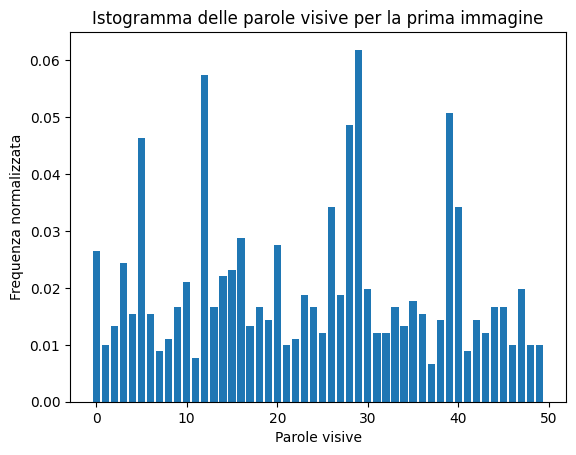

In [9]:
# Istogramma della prima immagine
plt.bar(range(K), image_histograms[0])
plt.xlabel('Parole visive')
plt.ylabel('Frequenza normalizzata')
plt.title('Istogramma delle parole visive per la prima immagine')
plt.show()

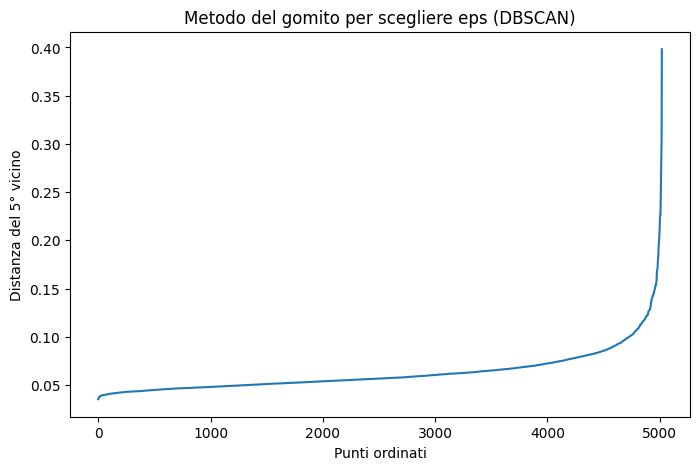

In [10]:
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import numpy as np

# Calcola la distanza dei 5 vicini più prossimi
neighbors = NearestNeighbors(n_neighbors=5)
neighbors_fit = neighbors.fit(image_histograms)  # image_histograms è la matrice degli istogrammi delle immagini
distances, indices = neighbors_fit.kneighbors(image_histograms)

# Ordina le distanze per visualizzare il gomito
distances = np.sort(distances[:, 4])  # Seleziona la distanza del 5° vicino
plt.figure(figsize=(8, 5))
plt.plot(distances)
plt.title('Metodo del gomito per scegliere eps (DBSCAN)')
plt.xlabel('Punti ordinati')
plt.ylabel('Distanza del 5° vicino')
plt.show()


eps	Determina la dimensione dell’area locale per ogni punto. Un valore più grande può includere più punti vicini.

min_samples	Determina il numero minimo di punti necessari per formare un cluster. Un valore più grande richiede cluster più densi.

Numero di outlier individuati: 9


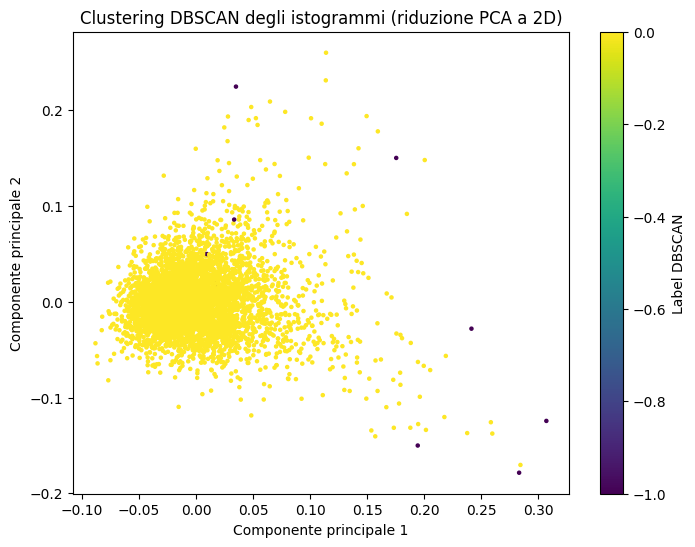

In [ ]:
# DBSCAN raggruppa i punti in base alla densità; parametri eps e min_samples devono essere calibrati.
dbscan = DBSCAN(eps=0.23, min_samples=20)  
dbscan_labels = dbscan.fit_predict(image_histograms)

# Gli outlier sono etichettati con -1 da DBSCAN
outlier_indices = np.where(dbscan_labels == -1)[0]
print(f"Numero di outlier individuati: {len(outlier_indices)}")

outlier_files = [valid_image_files[i] for i in outlier_indices]
# Visualizza la distribuzione dei dati in 2D tramite PCA
pca = PCA(n_components=2)
histograms_2d = pca.fit_transform(image_histograms)
plt.figure(figsize=(8, 6))
plt.scatter(histograms_2d[:, 0], histograms_2d[:, 1], c=dbscan_labels, cmap='viridis', s=5)
plt.title("Clustering DBSCAN degli istogrammi (riduzione PCA a 2D)")
plt.xlabel("Componente principale 1")
plt.ylabel("Componente principale 2")
plt.colorbar(label="Label DBSCAN")
plt.show()

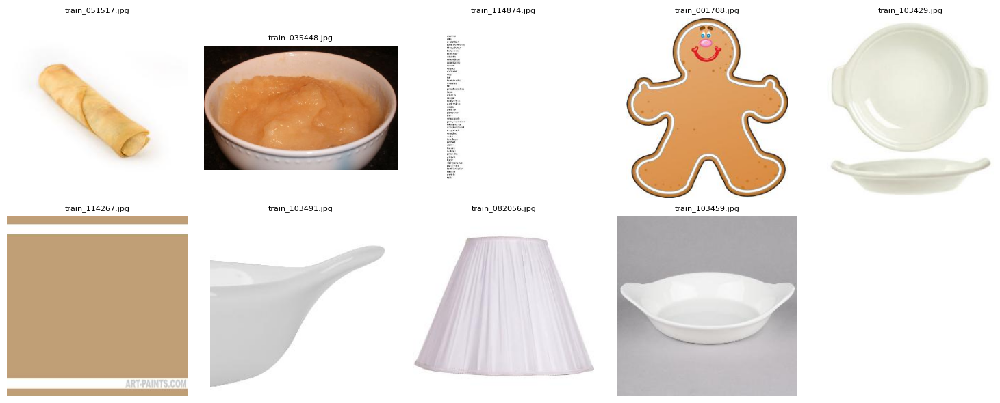

In [ ]:
from PIL import Image
# Verifica quanti file outlier sono stati identificati
num_images = len(outlier_files)
if num_images == 0:
    print("Nessuna immagine outlier trovata.")
else:
    num_cols = 5
    num_rows = (num_images + num_cols - 1) // num_cols

    plt.figure(figsize=(15, 3 * num_rows))
    
    for idx, file in enumerate(outlier_files):
        try:
            img = Image.open(file)
        except Exception as e:
            print(f"Errore nell'aprire l'immagine {file}: {e}")
            continue
        plt.subplot(num_rows, num_cols, idx + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(os.path.basename(file), fontsize=8)
    
    plt.tight_layout()
    plt.show()

## SIFT e distanze

Invece di applicare un classificatore globale o un clustering generale su tutte le immagini, possiamo trovare gli outlier localmente per ogni classe.

Vantaggi di fare il rilevamento degli outlier per classe:
- Riduzione dei falsi positivi: Eviti di rilevare immagini valide come outlier solo perché sono diverse da altre classi.
- Maggiore precisione: Gli outlier vengono rilevati in base a quanto si discostano dalle altre immagini della stessa classe.
- Flessibilità: Puoi eliminare gli outlier specifici che non rappresentano bene il cibo o la classe.

Approccio proposto:
1. Raggruppa le immagini per classe.
2. Per ogni classe, calcola i descrittori SIFT e la rappresentazione globale delle immagini.
3. Trova per ogni classe l’immagine più distante (usando la distanza euclidea o cosine).
Visualizza le immagini più distanti e verifica se sono outlier.

In [ ]:
import numpy as np
import os
import cv2
from sklearn.metrics import pairwise_distances
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm

def extract_sift_global_descriptor(image_path):
    sift = cv2.SIFT_create()
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        return None

    keypoints, descriptors = sift.detectAndCompute(img, None)
    if descriptors is None or len(descriptors) == 0:
        return None
    
    # Calcola la media dei descrittori SIFT
    return np.mean(descriptors, axis=0)

In [ ]:
# Estraiamo descrittori per ogni classe 
def extract_descriptors_by_class(labeled_dataset):
    descriptors_by_class = {}
    image_paths_by_class = {}

    print("Estrazione dei descrittori SIFT per ogni classe...")
    for image_path, class_label in tqdm(labeled_dataset, desc="Estrazione descrittori"):
        descriptor = extract_sift_global_descriptor(image_path)
        
        if descriptor is not None:
            if class_label not in descriptors_by_class:
                descriptors_by_class[class_label] = []
                image_paths_by_class[class_label] = []

            descriptors_by_class[class_label].append(descriptor)
            image_paths_by_class[class_label].append(image_path)

    for class_label in descriptors_by_class.keys():
        descriptors_by_class[class_label] = np.array(descriptors_by_class[class_label])

    return descriptors_by_class, image_paths_by_class

descriptors_by_class, image_paths_by_class = extract_descriptors_by_class(labeled_dataset)

print(f"Numero di classi processate: {len(descriptors_by_class)}")

Estrazione dei descrittori SIFT per ogni classe...


Estrazione descrittori: 100%|██████████| 5020/5020 [02:48<00:00, 29.77it/s]

Numero di classi processate: 251


In [ ]:
#  Immagine più distante per ogni classe
def find_most_distant_images(descriptors_by_class, image_paths_by_class):
    most_distant_images = {}

    for class_label, descriptors in descriptors_by_class.items():
        centroid = np.mean(descriptors, axis=0).reshape(1, -1)

        # Calcola la distanza di ogni immagine dal centroide
        distances = pairwise_distances(descriptors, centroid).flatten()

        farthest_index = np.argmax(distances)
        most_distant_image = image_paths_by_class[class_label][farthest_index]

        most_distant_images[class_label] = (most_distant_image, distances[farthest_index])

    return most_distant_images

In [ ]:

def visualize_outliers(most_distant_images, num_images=30):
    plt.figure(figsize=(15, 10))
    keys = list(most_distant_images.keys())[:num_images]

    for i, class_label in enumerate(keys):
        img_path, distance = most_distant_images[class_label]
        try:
            img = Image.open(img_path)
            plt.subplot(5, 6, i + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"Classe {class_label}\nDist: {distance:.2f}", fontsize=8)
        except Exception as e:
            print(f"Errore nell'aprire l'immagine {img_path}: {e}")

    plt.tight_layout()
    plt.show()

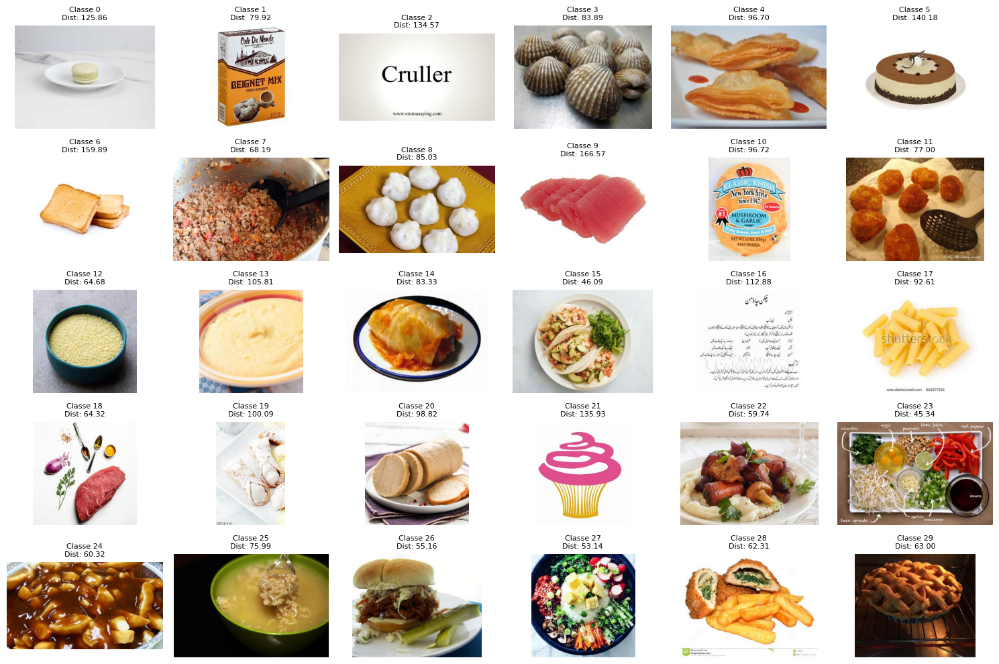

In [19]:
# ======== Esecuzione del processo completo ========
most_distant_images = find_most_distant_images(descriptors_by_class, image_paths_by_class)
visualize_outliers(most_distant_images)

Eliminiamo le immagini con distanza maggiore di 110, poichè, vedendo il grafico sopra notiamo che le immagini più distanti per ogni classe comprendono immagini di cibo, quelle che non sono di cibo hanno in comune la distanza maggiore di 110, andremo comunque ad eliminare delle immagini i cibo, ma magari essendo molto distanti dalla propria classe potrebbero comunque aiutare il modello a migliorare.

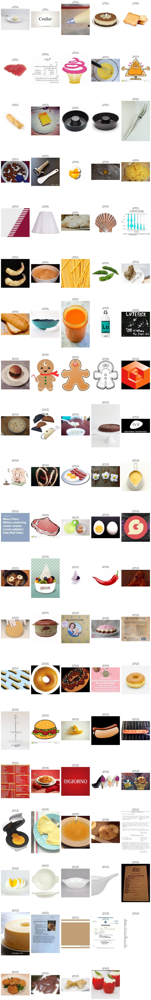

File CSV creato con successo: /kaggle/working/outliers_to_delete.csv
99


In [ ]:
import numpy as np
import os
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from sklearn.metrics import pairwise_distances

def find_and_visualize_and_save_distant_images(descriptors_by_class, image_paths_by_class, output_csv, distance_threshold=110):
    distant_images = []  # Per la visualizzazione
    images_to_delete = []  # Per il CSV

    for class_label, descriptors in descriptors_by_class.items():

        centroid = np.mean(descriptors, axis=0).reshape(1, -1)

        distances = pairwise_distances(descriptors, centroid).flatten()

        # Filtra le immagini con distanza maggiore del threshold
        for i, distance in enumerate(distances):
            if distance > distance_threshold:
                img_path = image_paths_by_class[class_label][i]
                distant_images.append((img_path, class_label, distance))
                images_to_delete.append(os.path.basename(img_path))  # Salva solo il nome del file

    # Visualizziamo le immagini con distanza > threshold
    if distant_images:
        plt.figure(figsize=(15, 5 * ((len(distant_images) + 4) // 5)))

        for i, (img_path, class_label, distance) in enumerate(distant_images):
            try:
                img = Image.open(img_path)
                plt.subplot((len(distant_images) + 4) // 5, 5, i + 1)
                plt.imshow(img)
                plt.axis('off')
                plt.title(f"Classe {class_label}\nDist: {distance:.2f}", fontsize=8)
            except Exception as e:
                print(f"Errore nell'aprire l'immagine {img_path}: {e}")

        plt.tight_layout()
        plt.show()
    else:
        print("Nessuna immagine con distanza superiore al threshold trovata.")

    if images_to_delete:
        df_outliers = pd.DataFrame(images_to_delete, columns=['image_filename'])
        df_outliers.to_csv(output_csv, index=False)
        print(f"File CSV creato con successo: {output_csv}")
    else:
        print("Nessuna immagine da salvare nel CSV.")
    print(len(df_outliers))
output_csv = "/kaggle/working/outliers_to_delete.csv"

find_and_visualize_and_save_distant_images(descriptors_by_class, image_paths_by_class, output_csv, distance_threshold=110)